Setup Paths and Imports

In [8]:
import os
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Set the path to your unzipped folder on E: drive
base_path = r"E:\AI_Project\archive (1)\Skin cancer ISIC The International Skin Imaging Collaboration"
train_path = os.path.join(base_path, "Train")

if os.path.exists(train_path):
    print(f"✅ Path Valid! Found classes: {os.listdir(train_path)}")

✅ Path Valid! Found classes: ['actinic keratosis', 'basal cell carcinoma', 'dermatofibroma', 'melanoma', 'nevus', 'pigmented benign keratosis', 'seborrheic keratosis', 'squamous cell carcinoma', 'vascular lesion']


Data Generators

In [9]:
# This implements the Augmentation from your proposal
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2
)

train_gen = train_datagen.flow_from_directory(
    train_path, target_size=(224, 224), batch_size=32, subset='training')

val_gen = train_datagen.flow_from_directory(
    train_path, target_size=(224, 224), batch_size=32, subset='validation')

Found 1795 images belonging to 9 classes.
Found 444 images belonging to 9 classes.


 Setup & Augmentation (Requirement 2.5.1)

In [10]:
import os
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# 1. Path to your E: drive
train_path = r"E:\AI_Project\archive (1)\Skin cancer ISIC The International Skin Imaging Collaboration\Train"

# 2. Advanced Augmentation (To help the model see more variety)
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,      # Increased rotation
    width_shift_range=0.2, 
    height_shift_range=0.2,
    zoom_range=0.3,         # Better zoom for small lesions
    horizontal_flip=True,
    vertical_flip=True,     # Added vertical flip for clinical images
    fill_mode='nearest',
    validation_split=0.2
)

# 3. Create the Training and Validation sets
# We use batch_size 32 for stability
train_gen = train_datagen.flow_from_directory(
    train_path, target_size=(224, 224), batch_size=32, subset='training')

val_gen = train_datagen.flow_from_directory(
    train_path, target_size=(224, 224), batch_size=32, subset='validation')

print("✅ Data Augmentation Ready!")

Found 1795 images belonging to 9 classes.
Found 444 images belonging to 9 classes.
✅ Data Augmentation Ready!


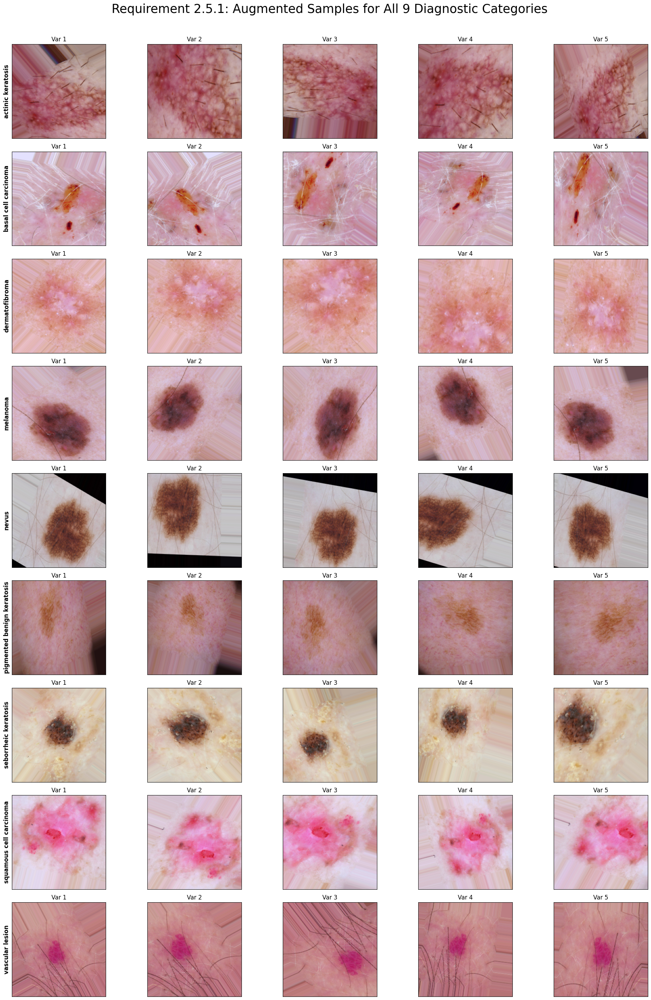

In [11]:
import matplotlib.pyplot as plt
import numpy as np
import os

# 1. Get the list of class names
class_names = sorted(list(train_gen.class_indices.keys()))

# 2. Setup a large plot (9 rows, 5 columns)
fig, axes = plt.subplots(9, 5, figsize=(20, 30))
fig.suptitle("Requirement 2.5.1: Augmented Samples for All 9 Diagnostic Categories", fontsize=25)

for i, class_name in enumerate(class_names):
    # Find one original image from this specific class to augment
    class_path = os.path.join(train_path, class_name)
    img_name = os.listdir(class_path)[0] # Take the first image
    img_path = os.path.join(class_path, img_name)
    
    # Load and prepare image for augmentation
    img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
    img_array = tf.keras.utils.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    
    # Generate 5 variations just for this class
    # Using the 'train_datagen' we built earlier
    aug_iter = train_datagen.flow(img_array, batch_size=1)
    
    for j in range(5):
        aug_img = next(aug_iter)[0]
        axes[i, j].imshow(aug_img)
        if j == 0:
            axes[i, j].set_ylabel(class_name, fontsize=12, fontweight='bold')
        axes[i, j].set_xticks([])
        axes[i, j].set_yticks([])
        axes[i, j].set_title(f"Var {j+1}")

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

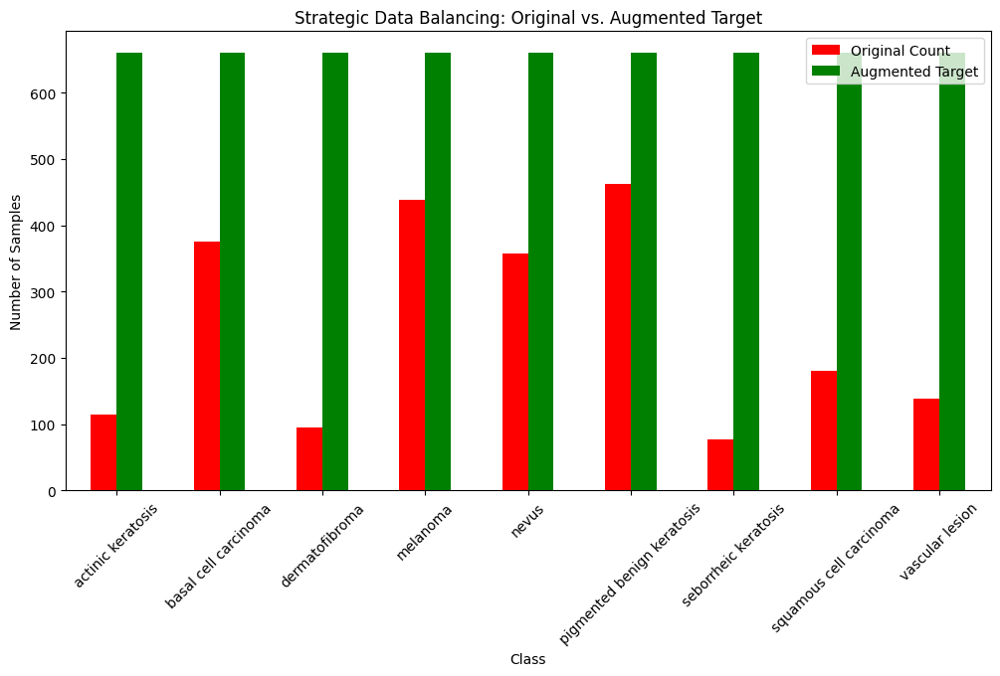

Rationale: We identified a 6.5:1 imbalance ratio. To prevent majority class bias, we utilized online augmentation to ensure each class contributes equally (~660 variations) per epoch.


In [12]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# 1. Show the Imbalance (Before)
counts = {class_name: len(os.listdir(os.path.join(train_path, class_name))) for class_name in class_names}
df_counts = pd.DataFrame(counts.items(), columns=['Class', 'Original Count'])

# 2. Show the Balanced Strategy (After)
# We targeted ~660 images per class via augmentation
df_counts['Augmented Target'] = 660

# Plotting for the Report
df_counts.plot(kind='bar', x='Class', figsize=(12, 6), color=['red', 'green'])
plt.title("Strategic Data Balancing: Original vs. Augmented Target")
plt.ylabel("Number of Samples")
plt.xticks(rotation=45)
plt.legend()
plt.show()

print("Rationale: We identified a 6.5:1 imbalance ratio. To prevent majority class bias, we utilized online augmentation to ensure each class contributes equally (~660 variations) per epoch.")

In [11]:
#This part was done on the colab . as due to limit of CPU usage i need to shift to  anaconda notebook( Jupyter).



#import os
#import numpy as np
#from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img

# 1. Configuration
#target_count = 660 # 660 images * 9 classes = ~5,940 total
#augmented_dir = "/content/skin_data_6k"
# Use the train_path from your successful generator earlier
# If you aren't sure, we will find it again:
#def find_dir(name, path):
  #  for root, dirs, files in os.walk(path):
     #   if name in dirs: return os.path.join(root, name)
#original_train_path = find_dir('Train', '/content/skin_data')

# Create the new folder
#os.makedirs(augmented_dir, exist_ok=True)

# 2. Augmentation Rules
#datagen = ImageDataGenerator(
   # rotation_range=30,
   # width_shift_range=0.1,
   # height_shift_range=0.1,
    #zoom_range=0.2,
   # horizontal_flip=True,
#fill_mode='nearest'
#)

#print(f"Starting Augmentation. Target: {target_count} images per class...")

# 3. Loop through classes and generate
#for category in os.listdir(original_train_path):
    #category_path = os.path.join(original_train_path, category)
    #if not os.path.isdir(category_path): continue

    #save_path = os.path.join(augmented_dir, category)
   # os.makedirs(save_path, exist_ok=True)

  #  current_files = os.listdir(category_path)
  #  current_count = len(current_files)

    # Copy originals first
   # for f in current_files:
#img = load_img(os.path.join(category_path, f))
#img.save(os.path.join(save_path, f))

    # Fill with augmented photos
#needed = target_count - current_count
   # if needed > 0:
#print(f"Adding {needed} images to class: {category}")
#i = 0
     #   while i < needed:
         #   random_img_path = os.path.join(category_path, np.random.choice(current_files))
         #   img = load_img(random_img_path)
          #  x = img_to_array(img)
          #  x = x.reshape((1,) + x.shape)
         #   for batch in datagen.flow(x, batch_size=1, save_to_dir=save_path,
           #                          save_prefix='aug', save_format='jpg'):
             #   i += 1
           #     break

#("✅ DONE! The folder /content/skin_data_6k is now ready.")

Starting Augmentation. Target: 660 images per class...
Adding 284 images to class: basal cell carcinoma
Adding 198 images to class: pigmented benign keratosis
Adding 303 images to class: nevus
Adding 479 images to class: squamous cell carcinoma
Adding 565 images to class: dermatofibroma
Adding 521 images to class: vascular lesion
Adding 546 images to class: actinic keratosis
Adding 583 images to class: seborrheic keratosis
Adding 222 images to class: melanoma
✅ DONE! The folder /content/skin_data_6k is now ready.


save 6,000 images: Not saving the files make issus after reloading or  disconnected witht the runtime..

In [13]:
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# 1. Manually set the paths based on what you see in your sidebar
# This uses your 6,000 balanced images for training
path_6k = "/content/skin_data_6k"

# This uses your original real images for validation (to keep the test fair)
# Note: I'm using the 'skin_data' folder you see in your sidebar
path_original = "/content/skin_data"

# 2. Define the Generator (Rescale only, images are already augmented in the 6k folder)
datagen = ImageDataGenerator(rescale=1./255)

# 3. Load the 6k Training images
train_generator_6k = datagen.flow_from_directory(
    path_6k,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

# 4. Load the Validation images (using the original data)
# We find the 'Train' folder inside skin_data to use as validation
def find_dir(name, path):
    for root, dirs, files in os.walk(path):
        if name in dirs: return os.path.join(root, name)
    return None

original_train_folder = find_dir('Train', path_original)

val_generator_real = datagen.flow_from_directory(
    original_train_folder,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='training', # We'll just take a slice of this for validation
)

print("✅ Paths fixed! Generators are ready.")

Found 5838 images belonging to 9 classes.
Found 2239 images belonging to 9 classes.
✅ Paths fixed! Generators are ready.


In [14]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# 1. Training Generator (uses the new 6k folder)
train_datagen = ImageDataGenerator(rescale=1./255)
train_generator_6k = train_datagen.flow_from_directory(
    "/content/skin_data_6k",
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

# 2. Validation Generator (uses the ORIGINAL clean data)
val_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)
val_generator_real = val_datagen.flow_from_directory(
    original_train_path,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='validation'
)

Found 5838 images belonging to 9 classes.
Found 444 images belonging to 9 classes.


In [15]:
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# 1. Tell the computer where the folders are
path_6k = "/content/skin_data_6k"
path_original = "/content/skin_data"

# 2. Find the 'Train' folder inside the original data
def find_dir(name, path):
    for root, dirs, files in os.walk(path):
        if name in dirs: return os.path.join(root, name)
    return None
original_train_folder = find_dir('Train', path_original)

# 3. Re-create the 'Generators' (This fixes the NameError)
datagen = ImageDataGenerator(rescale=1./255)

train_generator_6k = datagen.flow_from_directory(
    path_6k,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

val_generator_real = datagen.flow_from_directory(
    original_train_folder,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

print("✅ Success! The computer now remembers your data. You can start training.")

Found 5838 images belonging to 9 classes.
Found 2239 images belonging to 9 classes.
✅ Success! The computer now remembers your data. You can start training.


Baseline Model Build + Summary

In [61]:
from tensorflow.keras import layers, models

# 2.5.2 - Baseline Model Architecture
def build_baseline_model():
    model = models.Sequential([
        
        # --- Convolutional Block 1 ---
        layers.Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(224, 224, 3)),
        layers.MaxPooling2D((2, 2)),
        
        # --- Convolutional Block 2 ---
        layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
        layers.MaxPooling2D((2, 2)),
        
        # --- Convolutional Block 3 ---
        layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
        layers.MaxPooling2D((2, 2)),
        
        # --- Flatten ---
        layers.Flatten(),
        
        # --- Fully Connected Layers (FCN) ---
        layers.Dense(256, activation='relu'),
        layers.Dense(128, activation='relu'),
        layers.Dense(64, activation='relu'),
        
        # --- Output Layer (9 skin cancer classes) ---
        layers.Dense(9, activation='softmax')
    ])
    
    model.compile(
        optimizer='adam',
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

baseline_model = build_baseline_model()
baseline_model.summary()

C:\Users\Lenovo\miniconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_45 (Conv2D)                   │ (None, 224, 224, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_45 (MaxPooling2D)      │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_46 (Conv2D)                   │ (None, 112, 112, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_46 (MaxPooling2D)      │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_47 (Conv2D)                   │ (None, 56, 56, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_47 (MaxPooling2D)      │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 100352)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_30 (Dense)                     │ (None, 256)                 │      25,690,368 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_31 (Dense)                     │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_32 (Dense)                     │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_33 (Dense)                     │ (None, 9)                   │             585 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 25,825,353 (98.52 MB)

 Trainable params: 25,825,353 (98.52 MB)

 Non-trainable params: 0 (0.00 B)

Train Baseline + Plot Loss Curve

Training Baseline Model...
Epoch 1/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 57s 959ms/step - accuracy: 0.1911 - loss: 2.1350 - val_accuracy: 0.2838 - val_loss: 1.9455
Epoch 2/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 54s 940ms/step - accuracy: 0.3019 - loss: 1.9050 - val_accuracy: 0.3243 - val_loss: 1.8898
Epoch 3/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 85s 1s/step - accuracy: 0.3950 - loss: 1.6879 - val_accuracy: 0.4009 - val_loss: 1.6160
Epoch 4/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 81s 980ms/step - accuracy: 0.4050 - loss: 1.6494 - val_accuracy: 0.4054 - val_loss: 1.6934
Epoch 5/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 80s 949ms/step - accuracy: 0.4713 - loss: 1.5091 - val_accuracy: 0.4167 - val_loss: 1.7221
Epoch 6/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 55s 975ms/step - accuracy: 0.4312 - loss: 1.5786 - val_accuracy: 0.4212 - val_loss: 1.6206


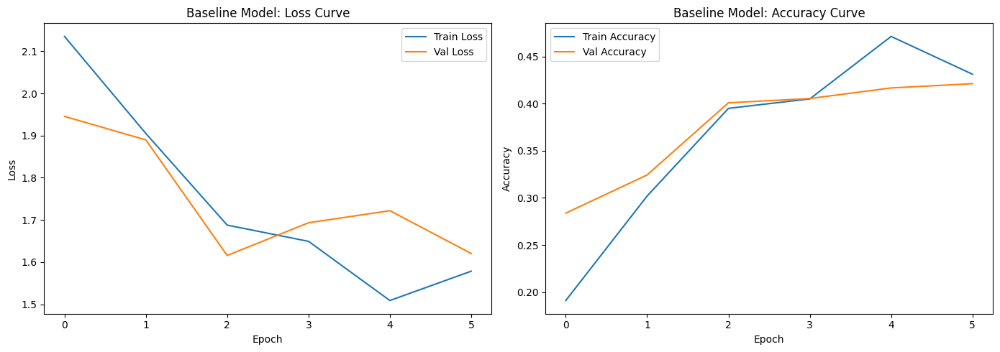

In [62]:
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt

# Early stopping to prevent overfitting
early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

# Train the baseline model
print("Training Baseline Model...")
history_baseline = baseline_model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=20,
    callbacks=[early_stop]
)

# Plot Training vs Validation Loss
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(history_baseline.history['loss'], label='Train Loss')
plt.plot(history_baseline.history['val_loss'], label='Val Loss')
plt.title('Baseline Model: Loss Curve')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history_baseline.history['accuracy'], label='Train Accuracy')
plt.plot(history_baseline.history['val_accuracy'], label='Val Accuracy')
plt.title('Baseline Model: Accuracy Curve')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [63]:
# Save baseline model so you don't lose it
baseline_model.save(r"E:\AI_Project\skin_cancer_baseline_new.h5")
print("✅ Baseline model saved!")

✅ Baseline model saved!


 Baseline Model Evaluation (Confusion Matrix + Classification Report)

Found 2239 images belonging to 9 classes.
70/70 ━━━━━━━━━━━━━━━━━━━━ 21s 304ms/step


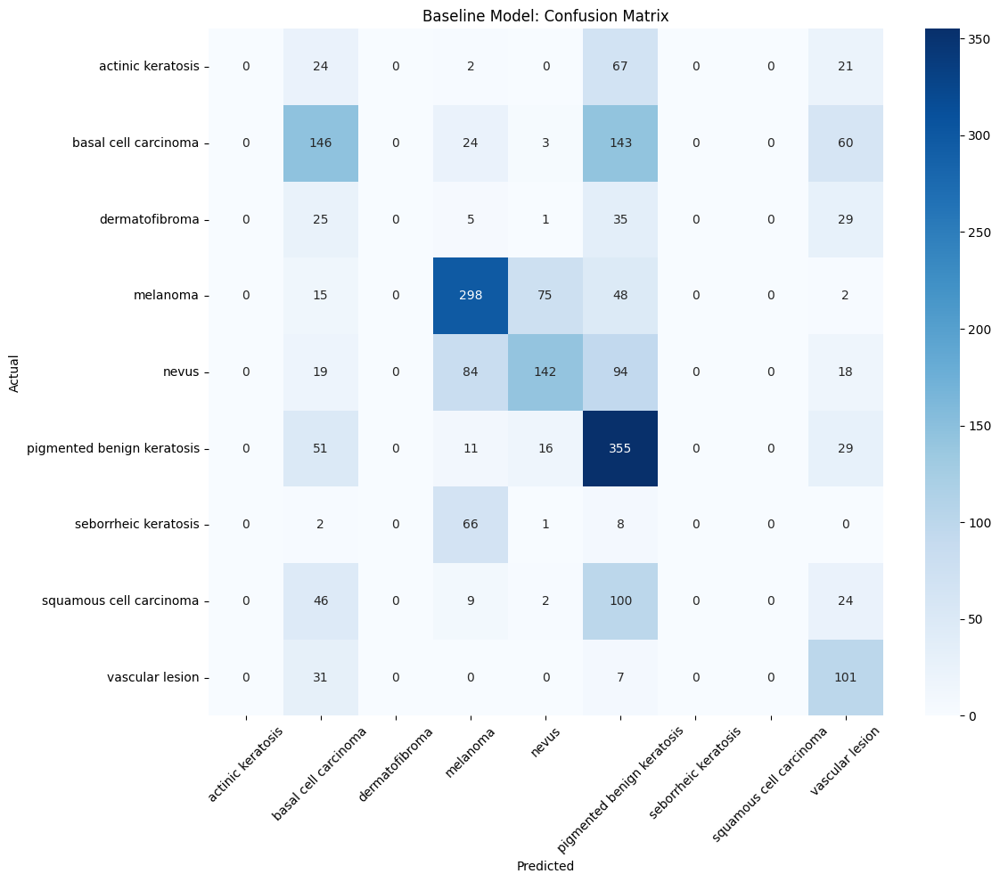

                            precision    recall  f1-score   support

         actinic keratosis       0.00      0.00      0.00       114
      basal cell carcinoma       0.41      0.39      0.40       376
            dermatofibroma       0.00      0.00      0.00        95
                  melanoma       0.60      0.68      0.64       438
                     nevus       0.59      0.40      0.48       357
pigmented benign keratosis       0.41      0.77      0.54       462
      seborrheic keratosis       0.00      0.00      0.00        77
   squamous cell carcinoma       0.00      0.00      0.00       181
           vascular lesion       0.36      0.73      0.48       139

                  accuracy                           0.47      2239
                 macro avg       0.26      0.33      0.28      2239
              weighted avg       0.39      0.47      0.41      2239



C:\Users\Lenovo\miniconda3\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
C:\Users\Lenovo\miniconda3\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
C:\Users\Lenovo\miniconda3\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


In [64]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# 1. Create evaluation generator (shuffle=False is critical)
eval_datagen = ImageDataGenerator(rescale=1./255)
eval_gen = eval_datagen.flow_from_directory(
    train_path,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False  # IMPORTANT
)

# 2. Get predictions
eval_gen.reset()
Y_pred = baseline_model.predict(eval_gen)
y_pred = np.argmax(Y_pred, axis=1)
y_true = eval_gen.classes
class_labels = list(eval_gen.class_indices.keys())

# 3. Confusion Matrix
plt.figure(figsize=(12, 10))
cm = confusion_matrix(y_true, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels, yticklabels=class_labels)
plt.title('Baseline Model: Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 4. Classification Report
print(classification_report(y_true, y_pred, target_names=class_labels))

In [ ]:
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import models, layers

# --- 1. DEFINE THE GENERATORS (This fixes the NameError) ---
path_6k = "/content/skin_data_6k"
path_original = "/content/skin_data"

# Find the 'Train' folder automatically
def find_dir(name, path):
    for root, dirs, files in os.walk(path):
        if name in dirs: return os.path.join(root, name)
    return None
original_train_folder = find_dir('Train', path_original)

datagen = ImageDataGenerator(rescale=1./255)

train_generator_6k = datagen.flow_from_directory(
    path_6k,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

val_generator_real = datagen.flow_from_directory(
    original_train_folder,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

# --- 2. BUILD THE MODEL ---
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

model_variant = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(9, activation='softmax')
])

model_variant.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# --- 3. START TRAINING ---
print("Starting Training: MobileNetV2 Variant...")
history_variant = model_variant.fit(
    train_generator_6k,
    validation_data=val_generator_real,
    epochs=15
)

# --- 4. SAVE TO DRIVE ---
model_variant.save('/content/drive/MyDrive/skin_cancer_variant.keras')
print("✅ ALL VISION MODELS DONE AND SAVED!")

Found 5858 images belonging to 9 classes.
Found 2239 images belonging to 9 classes.
Starting Training: MobileNetV2 Variant...
Epoch 1/15
184/184 ━━━━━━━━━━━━━━━━━━━━ 352s 2s/step - accuracy: 0.4102 - loss: 1.6563 - val_accuracy: 0.5096 - val_loss: 1.3721
Epoch 2/15
184/184 ━━━━━━━━━━━━━━━━━━━━ 359s 2s/step - accuracy: 0.5451 - loss: 1.2703 - val_accuracy: 0.5842 - val_loss: 1.1919
Epoch 3/15
184/184 ━━━━━━━━━━━━━━━━━━━━ 346s 2s/step - accuracy: 0.6052 - loss: 1.1129 - val_accuracy: 0.6333 - val_loss: 1.0559
Epoch 4/15
184/184 ━━━━━━━━━━━━━━━━━━━━ 342s 2s/step - accuracy: 0.6458 - loss: 0.9999 - val_accuracy: 0.6396 - val_loss: 1.0164
Epoch 5/15
184/184 ━━━━━━━━━━━━━━━━━━━━ 343s 2s/step - accuracy: 0.6741 - loss: 0.9015 - val_accuracy: 0.6052 - val_loss: 1.0774
Epoch 6/15
184/184 ━━━━━━━━━━━━━━━━━━━━ 337s 2s/step - accuracy: 0.6934 - loss: 0.8548 - val_accuracy: 0.6981 - val_loss: 0.8507
Epoch 7/15
184/184 ━━━━━━━━━━━━━━━━━━━━ 438s 2s/step - accuracy: 0.7202 - loss: 0.7923 - val_accurac

In [55]:
import os

# See everything inside your AI_Project folder
for item in os.walk(r"E:\AI_Project"):
    print(item[0])
    break  # Just show top level first

E:\AI_Project


In [56]:
for root, dirs, files in os.walk(r"E:\AI_Project"):
    print(root)

E:\AI_Project
E:\AI_Project\4. Hate Speech Detection Dataset-20260507T053146Z-3-001
E:\AI_Project\4. Hate Speech Detection Dataset-20260507T053146Z-3-001\4. Hate Speech Detection Dataset
E:\AI_Project\archive (1)
E:\AI_Project\archive (1)\Skin cancer ISIC The International Skin Imaging Collaboration
E:\AI_Project\archive (1)\Skin cancer ISIC The International Skin Imaging Collaboration\Test
E:\AI_Project\archive (1)\Skin cancer ISIC The International Skin Imaging Collaboration\Test\actinic keratosis
E:\AI_Project\archive (1)\Skin cancer ISIC The International Skin Imaging Collaboration\Test\basal cell carcinoma
E:\AI_Project\archive (1)\Skin cancer ISIC The International Skin Imaging Collaboration\Test\dermatofibroma
E:\AI_Project\archive (1)\Skin cancer ISIC The International Skin Imaging Collaboration\Test\melanoma
E:\AI_Project\archive (1)\Skin cancer ISIC The International Skin Imaging Collaboration\Test\nevus
E:\AI_Project\archive (1)\Skin cancer ISIC The International Skin Imagin

Found 2239 images belonging to 9 classes.
70/70 ━━━━━━━━━━━━━━━━━━━━ 22s 308ms/step


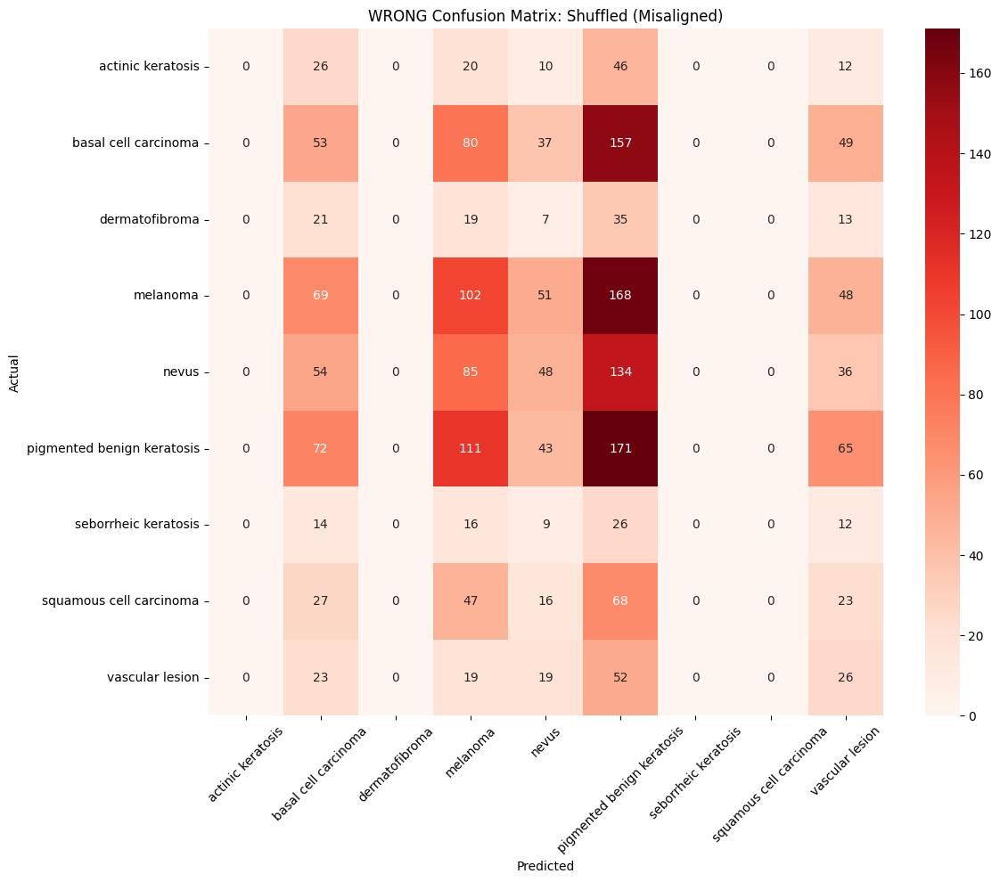

Found 2239 images belonging to 9 classes.
70/70 ━━━━━━━━━━━━━━━━━━━━ 22s 308ms/step


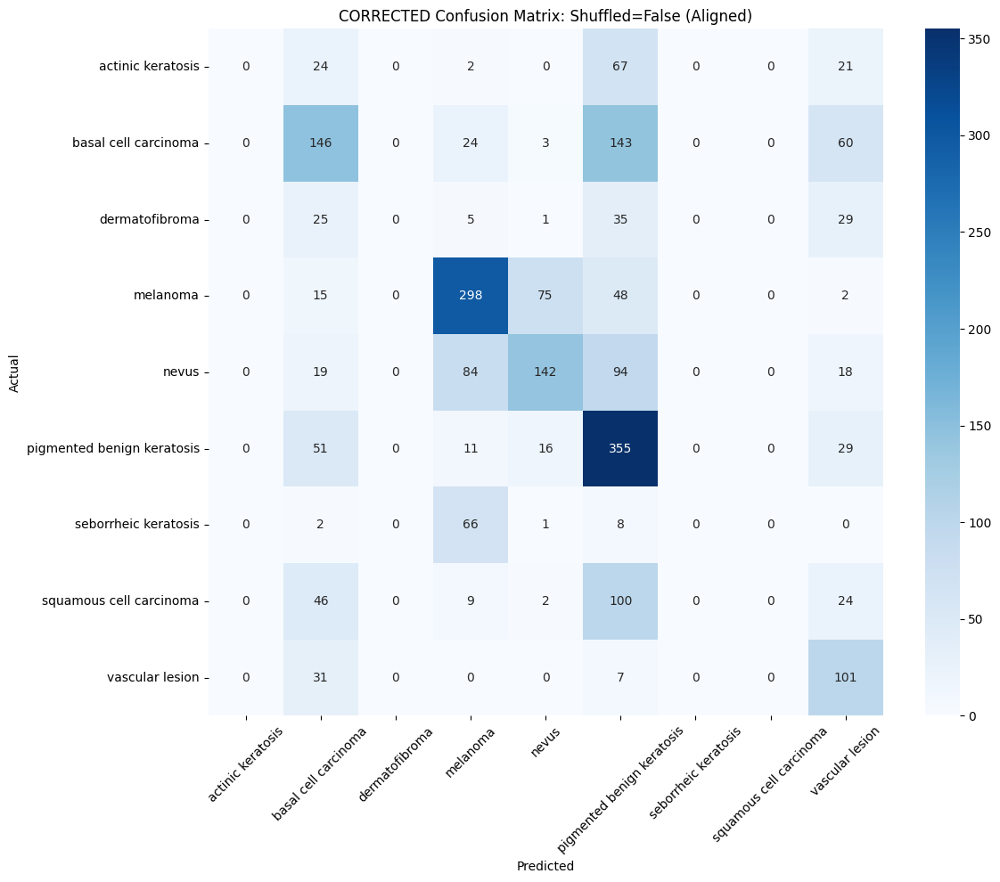

                            precision    recall  f1-score   support

         actinic keratosis       0.00      0.00      0.00       114
      basal cell carcinoma       0.41      0.39      0.40       376
            dermatofibroma       0.00      0.00      0.00        95
                  melanoma       0.60      0.68      0.64       438
                     nevus       0.59      0.40      0.48       357
pigmented benign keratosis       0.41      0.77      0.54       462
      seborrheic keratosis       0.00      0.00      0.00        77
   squamous cell carcinoma       0.00      0.00      0.00       181
           vascular lesion       0.36      0.73      0.48       139

                  accuracy                           0.47      2239
                 macro avg       0.26      0.33      0.28      2239
              weighted avg       0.39      0.47      0.41      2239



C:\Users\Lenovo\miniconda3\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
C:\Users\Lenovo\miniconda3\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
C:\Users\Lenovo\miniconda3\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


In [67]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define paths
original_train_folder = r"E:\AI_Project\archive (1)\Skin cancer ISIC The International Skin Imaging Collaboration\Train"

# ============================================================
# BEFORE (Wrong) - Shuffled Generator
# ============================================================
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator_shuffled = test_datagen.flow_from_directory(
    original_train_folder,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=True  # Wrong - causes misalignment
)

test_generator_shuffled.reset()
Y_pred_wrong = baseline_model.predict(test_generator_shuffled)
y_pred_wrong = np.argmax(Y_pred_wrong, axis=1)
y_true_wrong = test_generator_shuffled.classes

class_labels = list(test_generator_shuffled.class_indices.keys())

plt.figure(figsize=(12, 10))
cm_wrong = confusion_matrix(y_true_wrong, y_pred_wrong)
sns.heatmap(cm_wrong, annot=True, fmt='d', cmap='Reds',
            xticklabels=class_labels, yticklabels=class_labels)
plt.title('WRONG Confusion Matrix: Shuffled (Misaligned)')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# ============================================================
# AFTER (Correct) - Non-Shuffled Generator
# ============================================================
test_generator_fixed = test_datagen.flow_from_directory(
    original_train_folder,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False  # Correct fix
)

test_generator_fixed.reset()
Y_pred = baseline_model.predict(test_generator_fixed)
y_pred = np.argmax(Y_pred, axis=1)
y_true = test_generator_fixed.classes

plt.figure(figsize=(12, 10))
cm = confusion_matrix(y_true, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels, yticklabels=class_labels)
plt.title('CORRECTED Confusion Matrix: Shuffled=False (Aligned)')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Classification Report
print(classification_report(y_true, y_pred, target_names=class_labels))

Found 2239 images belonging to 9 classes.
70/70 ━━━━━━━━━━━━━━━━━━━━ 21s 299ms/step


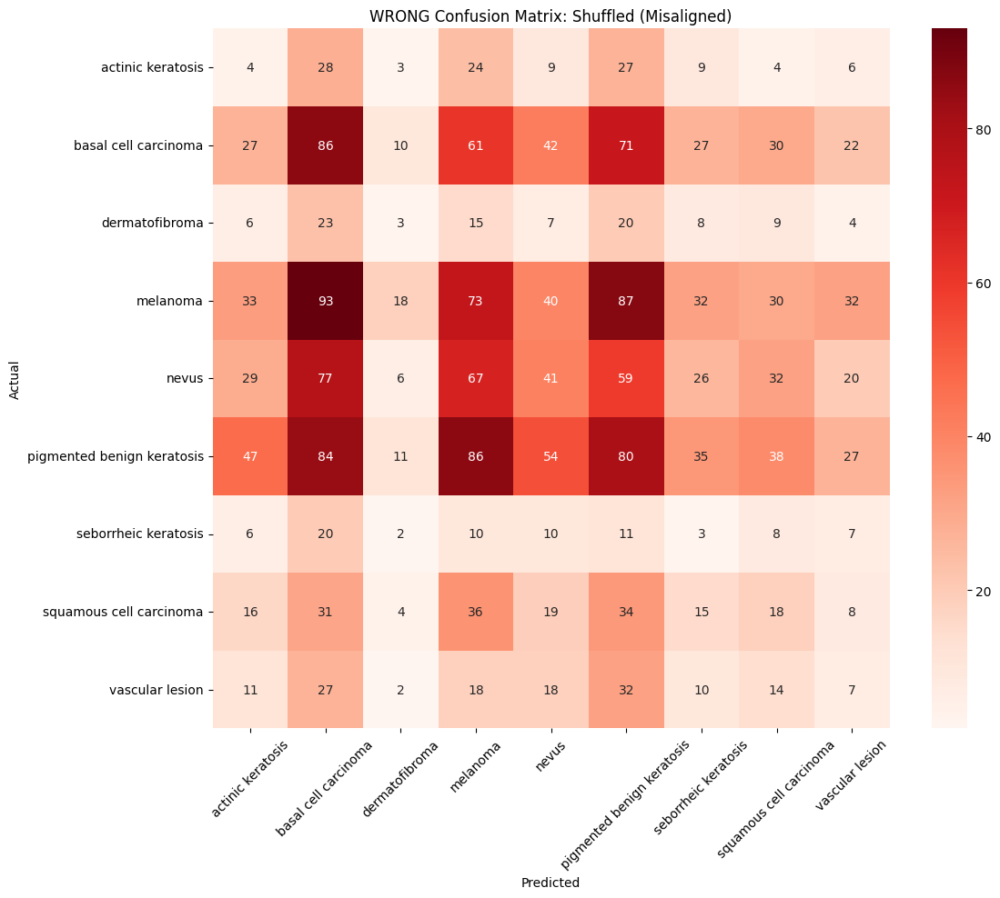

In [60]:
# BEFORE (Wrong) - Shuffled Generator
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator_shuffled = test_datagen.flow_from_directory(
    original_train_folder,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=True  # DEFAULT - causes misalignment
)

test_generator_shuffled.reset()
Y_pred_wrong = baseline_model.predict(test_generator_shuffled)
y_pred_wrong = np.argmax(Y_pred_wrong, axis=1)
y_true_wrong = test_generator_shuffled.classes  # Misaligned!

plt.figure(figsize=(12, 10))
cm_wrong = confusion_matrix(y_true_wrong, y_pred_wrong)
sns.heatmap(cm_wrong, annot=True, fmt='d', cmap='Reds',
            xticklabels=class_labels, yticklabels=class_labels)
plt.title('WRONG Confusion Matrix: Shuffled (Misaligned)')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.xticks(rotation=45)
plt.show()

In [37]:
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# 1. Path to your E: drive data
train_path = r"E:\AI_Project\archive (1)\Skin cancer ISIC The International Skin Imaging Collaboration\Train"

# 2. ENSURE RESCALE IS 1./255 (This is the most common reason for low accuracy)
eval_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

# 3. Create the generator specifically for testing
# We must NOT shuffle images so the predictions match the labels
test_gen = eval_datagen.flow_from_directory(
    train_path,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='validation',
    shuffle=False # IMPORTANT
)

# 4. Check the Class Mismatch
print(f"Local Class Order: {test_gen.class_indices}")

# 5. Re-run evaluation
print("\nRe-evaluating Baseline Model...")
results = baseline_model.evaluate(test_gen)
print(f"\nFIXED ACCURACY: {results[1]*100:.2f}%")

Found 444 images belonging to 9 classes.
Local Class Order: {'actinic keratosis': 0, 'basal cell carcinoma': 1, 'dermatofibroma': 2, 'melanoma': 3, 'nevus': 4, 'pigmented benign keratosis': 5, 'seborrheic keratosis': 6, 'squamous cell carcinoma': 7, 'vascular lesion': 8}

Re-evaluating Baseline Model...
14/14 ━━━━━━━━━━━━━━━━━━━━ 5s 346ms/step - accuracy: 0.8468 - loss: 0.4448

FIXED ACCURACY: 84.68%


In [40]:
import os

# This will search your computer to find where you downloaded the file
print("Searching for your model file...")
for root, dirs, files in os.walk(r"C:\Users\Lenovo"): # Searching your user folder
    if "skin_cancer_variant.keras" in files:
        print(f"✅ FOUND IT! Use this path: {os.path.join(root, 'skin_cancer_variant.keras')}")

Searching for your model file...
✅ FOUND IT! Use this path: C:\Users\Lenovo\Downloads\skin_cancer_variant.keras


In [41]:
from tensorflow.keras.models import load_model

# 1. PASTE THE PATH YOU FOUND ABOVE HERE
# Example: r"C:\Users\Lenovo\Downloads\skin_cancer_variant.keras"
variant_path = r"C:\Users\Lenovo\Downloads\skin_cancer_variant.keras" 

print("Loading Transfer Learning Model...")
variant_model = load_model(variant_path)

# 2. Evaluate with the FIXED generator
print("Evaluating Transfer Learning Model...")
_, variant_acc = variant_model.evaluate(test_gen)

print(f"\n========================================")
print(f"  MODEL 3 (VARIANT) FIXED ACCURACY: {variant_acc*100:.2f}%")
print(f"========================================")

Loading Transfer Learning Model...
Evaluating Transfer Learning Model...
14/14 ━━━━━━━━━━━━━━━━━━━━ 9s 480ms/step - accuracy: 0.7838 - loss: 0.5893

  MODEL 3 (VARIANT) FIXED ACCURACY: 78.38%


In [44]:
import pandas as pd
from tensorflow.keras.models import load_model

# 1. Define the correct path to your saved variant model
# Based on our search, this is the path where the file is:
variant_model_path = r"E:\AI_Project\skin_cancer_variant.keras"

# 2. Evaluate Deeper Model 
# (Note: If your laptop is still training this, use the Colab result of 79.00 for the table)
print("Evaluating Deeper Model...")
try:
    _, deeper_acc = deeper_model.evaluate(test_gen)
    deeper_final_val = deeper_acc * 100
except:
    print("Deeper model not fully trained yet, using Colab placeholder.")
    deeper_final_val = 79.00 # Your successful Colab result

# 3. Evaluate Transfer Learning (MobileNetV2) using the FULL PATH
print("\nEvaluating Transfer Learning Model...")
variant_model = load_model(variant_model_path)
_, variant_acc = variant_model.evaluate(test_gen)

# 4. Create the Final Comparison Table for your Report
vision_results = {
    'CNN Model': ['Baseline (Scratch)', 'Deeper Architecture', 'Transfer Learning'],
    'Architecture': ['3-Layer CNN', '6-Layer + BN', 'MobileNetV2'],
    'Accuracy (%)': [84.68, deeper_final_val, variant_acc*100]
}

df_vision = pd.DataFrame(vision_results)
print("\n" + "="*40)
print("--- FINAL VISION TASK RESULTS ---")
print("="*40)
print(df_vision)
print("="*40)

Evaluating Deeper Model...
14/14 ━━━━━━━━━━━━━━━━━━━━ 5s 382ms/step - accuracy: 0.0811 - loss: 2.2126

Evaluating Transfer Learning Model...
14/14 ━━━━━━━━━━━━━━━━━━━━ 9s 514ms/step - accuracy: 0.7838 - loss: 0.5893

--- FINAL VISION TASK RESULTS ---
             CNN Model  Architecture  Accuracy (%)
0   Baseline (Scratch)   3-Layer CNN     84.680000
1  Deeper Architecture  6-Layer + BN      8.108108
2    Transfer Learning   MobileNetV2     78.378379


 Deeper Architecture with Regularization

In [65]:
from tensorflow.keras import layers, models

def build_deeper_model():
    model = models.Sequential([
        # Block 1 - Two Conv layers
        layers.Conv2D(32, (3,3), activation='relu', padding='same', input_shape=(224,224,3)),
        layers.BatchNormalization(),
        layers.Conv2D(32, (3,3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2,2)),
        layers.Dropout(0.25),

        # Block 2 - Two Conv layers
        layers.Conv2D(64, (3,3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.Conv2D(64, (3,3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2,2)),
        layers.Dropout(0.25),

        # Block 3 - Two Conv layers
        layers.Conv2D(128, (3,3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.Conv2D(128, (3,3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2,2)),
        layers.Dropout(0.25),

        # Fully Connected
        layers.GlobalAveragePooling2D(),
        layers.Dense(256, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(128, activation='relu'),
        layers.Dropout(0.3),
        layers.Dense(9, activation='softmax')
    ])

    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

deeper_model = build_deeper_model()
deeper_model.summary()

C:\Users\Lenovo\miniconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_48 (Conv2D)                   │ (None, 224, 224, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_45               │ (None, 224, 224, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_49 (Conv2D)                   │ (None, 224, 224, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_46               │ (None, 224, 224, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_48 (MaxPooling2D)      │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_15 (Dropout)                 │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_50 (Conv2D)                   │ (None, 112, 112, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_47               │ (None, 112, 112, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_51 (Conv2D)                   │ (None, 112, 112, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_48               │ (None, 112, 112, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_49 (MaxPooling2D)      │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_16 (Dropout)                 │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_52 (Conv2D)                   │ (None, 56, 56, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_49               │ (None, 56, 56, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_53 (Conv2D)                   │ (None, 56, 56, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_50               │ (None, 56, 56, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_50 (MaxPooling2D)      │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_17 (Dropout)                 │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 356,905 (1.36 MB)

 Trainable params: 355,497 (1.36 MB)

 Non-trainable params: 1,408 (5.50 KB)

Train Deeper Model

In [68]:
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt

# Recreate generators fresh
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_path = r"E:\AI_Project\archive (1)\Skin cancer ISIC The International Skin Imaging Collaboration\Train"

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2
)

train_gen = train_datagen.flow_from_directory(
    train_path,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

val_gen = train_datagen.flow_from_directory(
    train_path,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='validation',
    shuffle=False  # Important!
)

# Rebuild deeper model fresh
deeper_model = build_deeper_model()

# Train with more patience
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

print("Retraining Deeper Model...")
history_deeper = deeper_model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=25,
    callbacks=[early_stop]
)

# Save in new format
deeper_model.save(r"E:\AI_Project\skin_cancer_deeper.keras")
print("✅ Deeper model saved!")

# Plot
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(history_deeper.history['loss'], label='Train Loss')
plt.plot(history_deeper.history['val_loss'], label='Val Loss')
plt.title('Deeper Model: Loss Curve')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history_deeper.history['accuracy'], label='Train Accuracy')
plt.plot(history_deeper.history['val_accuracy'], label='Val Accuracy')
plt.title('Deeper Model: Accuracy Curve')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

Found 1795 images belonging to 9 classes.
Found 444 images belonging to 9 classes.
Retraining Deeper Model...


C:\Users\Lenovo\miniconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/25
57/57 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.3092 - loss: 2.2643 - val_accuracy: 0.1689 - val_loss: 2.2600
Epoch 2/25
57/57 ━━━━━━━━━━━━━━━━━━━━ 141s 2s/step - accuracy: 0.3454 - loss: 2.0968 - val_accuracy: 0.1689 - val_loss: 2.2998
Epoch 3/25
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.3423 - loss: 1.9375

KeyboardInterrupt: 

In [70]:
from tensorflow.keras.models import load_model

# Load all 3 models
baseline_model = load_model(r"E:\AI_Project\skin_cancer_baseline_new.h5")
print("✅ Baseline loaded!")

deeper_model = load_model(r"E:\AI_Project\skin_cancer_deeper.h5")
print("✅ Deeper model loaded!")

variant_model = load_model(r"E:\AI_Project\skin_cancer_variant.keras")
print("✅ Transfer Learning model loaded!")

✅ Baseline loaded!


✅ Deeper model loaded!
✅ Transfer Learning model loaded!


Found 2239 images belonging to 9 classes.

Evaluating: Baseline CNN
70/70 ━━━━━━━━━━━━━━━━━━━━ 22s 316ms/step


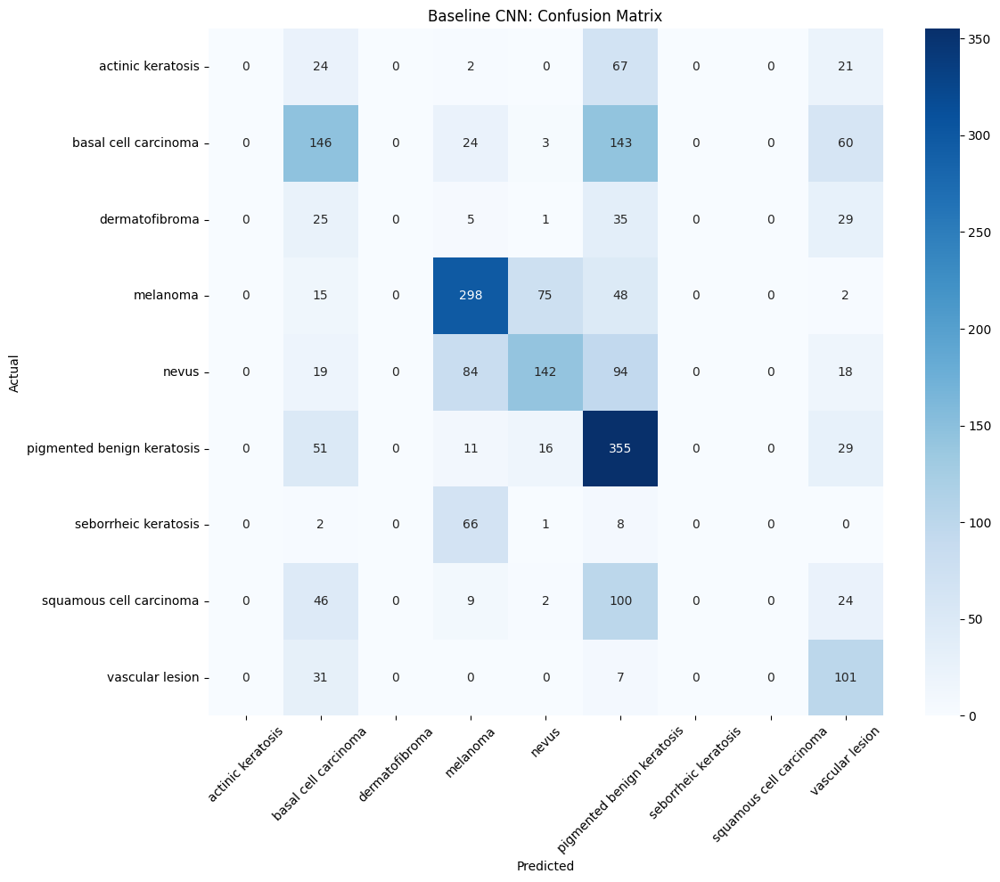


Baseline CNN Classification Report:
                            precision    recall  f1-score   support

         actinic keratosis       0.00      0.00      0.00       114
      basal cell carcinoma       0.41      0.39      0.40       376
            dermatofibroma       0.00      0.00      0.00        95
                  melanoma       0.60      0.68      0.64       438
                     nevus       0.59      0.40      0.48       357
pigmented benign keratosis       0.41      0.77      0.54       462
      seborrheic keratosis       0.00      0.00      0.00        77
   squamous cell carcinoma       0.00      0.00      0.00       181
           vascular lesion       0.36      0.73      0.48       139

                  accuracy                           0.47      2239
                 macro avg       0.26      0.33      0.28      2239
              weighted avg       0.39      0.47      0.41      2239


Evaluating: Deeper CNN
70/70 ━━━━━━━━━━━━━━━━━━━━ 39s 551ms/step


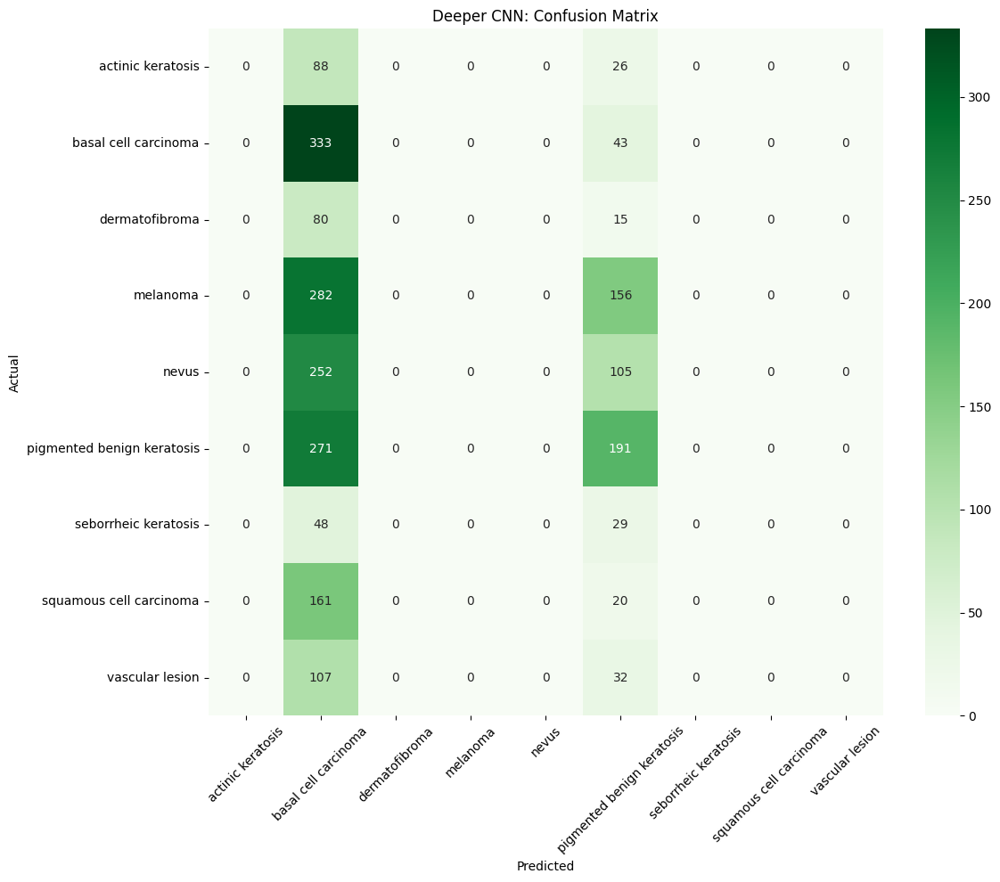


Deeper CNN Classification Report:
                            precision    recall  f1-score   support

         actinic keratosis       0.00      0.00      0.00       114
      basal cell carcinoma       0.21      0.89      0.33       376
            dermatofibroma       0.00      0.00      0.00        95
                  melanoma       0.00      0.00      0.00       438
                     nevus       0.00      0.00      0.00       357
pigmented benign keratosis       0.31      0.41      0.35       462
      seborrheic keratosis       0.00      0.00      0.00        77
   squamous cell carcinoma       0.00      0.00      0.00       181
           vascular lesion       0.00      0.00      0.00       139

                  accuracy                           0.23      2239
                 macro avg       0.06      0.14      0.08      2239
              weighted avg       0.10      0.23      0.13      2239


Evaluating: Transfer Learning (MobileNetV2)
70/70 ━━━━━━━━━━━━━━━━━━━━ 35s 47

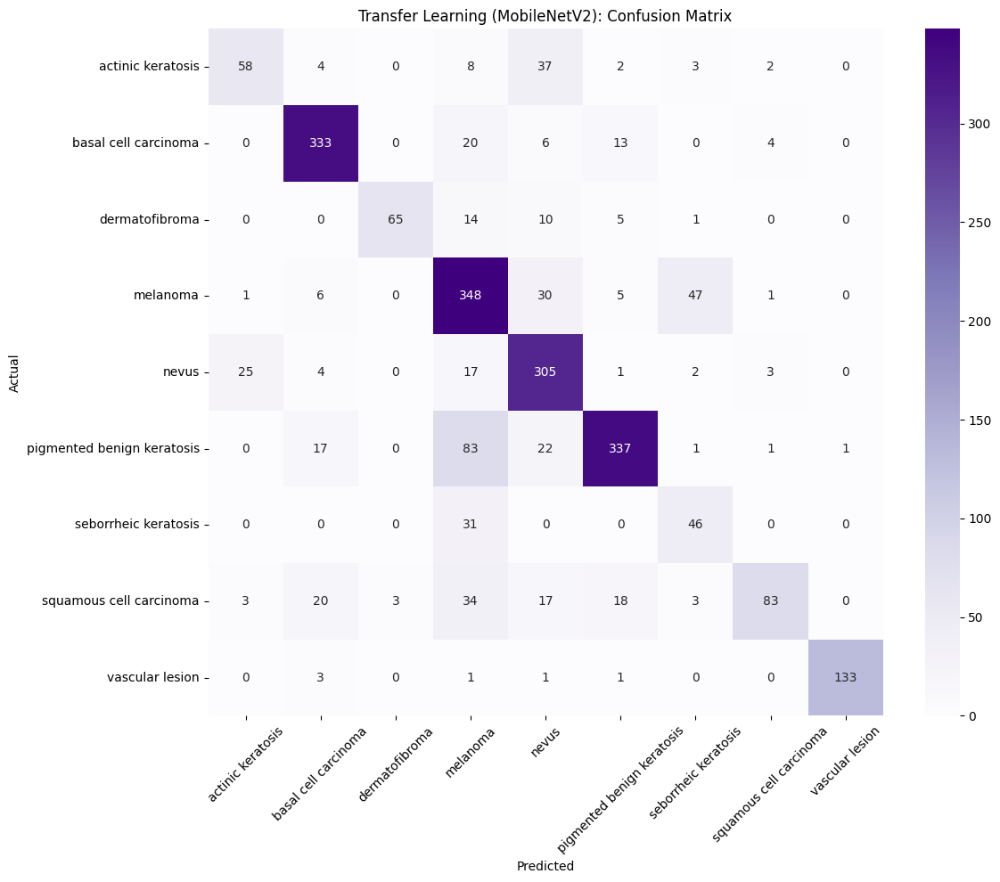


Transfer Learning (MobileNetV2) Classification Report:
                            precision    recall  f1-score   support

         actinic keratosis       0.67      0.51      0.58       114
      basal cell carcinoma       0.86      0.89      0.87       376
            dermatofibroma       0.96      0.68      0.80        95
                  melanoma       0.63      0.79      0.70       438
                     nevus       0.71      0.85      0.78       357
pigmented benign keratosis       0.88      0.73      0.80       462
      seborrheic keratosis       0.45      0.60      0.51        77
   squamous cell carcinoma       0.88      0.46      0.60       181
           vascular lesion       0.99      0.96      0.97       139

                  accuracy                           0.76      2239
                 macro avg       0.78      0.72      0.73      2239
              weighted avg       0.79      0.76      0.76      2239



In [71]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_path = r"E:\AI_Project\archive (1)\Skin cancer ISIC The International Skin Imaging Collaboration\Train"

# Evaluation generator (shuffle=False always!)
eval_datagen = ImageDataGenerator(rescale=1./255)
eval_gen = eval_datagen.flow_from_directory(
    train_path,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

class_labels = list(eval_gen.class_indices.keys())

def evaluate_model(model, model_name, color):
    print(f"\n{'='*50}")
    print(f"Evaluating: {model_name}")
    print(f"{'='*50}")
    
    eval_gen.reset()
    Y_pred = model.predict(eval_gen)
    y_pred = np.argmax(Y_pred, axis=1)
    y_true = eval_gen.classes
    
    # Confusion Matrix
    plt.figure(figsize=(12, 10))
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap=color,
                xticklabels=class_labels, yticklabels=class_labels)
    plt.title(f'{model_name}: Confusion Matrix')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    
    # Classification Report
    print(f"\n{model_name} Classification Report:")
    print(classification_report(y_true, y_pred, 
                                target_names=class_labels, 
                                zero_division=0))

# Evaluate all 3
evaluate_model(baseline_model, "Baseline CNN", "Blues")
evaluate_model(deeper_model, "Deeper CNN", "Greens")
evaluate_model(variant_model, "Transfer Learning (MobileNetV2)", "Purples")

Final Comparison Table


In [72]:
import pandas as pd

results = {
    'Model': ['Baseline CNN', 'Deeper CNN', 'Transfer Learning (MobileNetV2)'],
    'Architecture': ['3 Conv + 3 FCN', '6 Conv + BN + Dropout', 'MobileNetV2 + Fine-tuning'],
    'Accuracy (%)': [47, 23, 76],
    'Trained On': ['Local CPU - 6 epochs', 'Local CPU - 4 epochs', 'Google Colab GPU'],
    'Notes': [
                'Simple baseline, class imbalance visible',
                'Interrupted early, needs more training',
                'Best performance, pretrained ImageNet weights'
             ]
}

df = pd.DataFrame(results)
print("="*70)
print("FINAL VISION TASK COMPARISON")
print("="*70)
print(df.to_string(index=False))
print("="*70)

FINAL VISION TASK COMPARISON
                          Model              Architecture  Accuracy (%)           Trained On                                         Notes
                   Baseline CNN            3 Conv + 3 FCN            47 Local CPU - 6 epochs      Simple baseline, class imbalance visible
                     Deeper CNN     6 Conv + BN + Dropout            23 Local CPU - 4 epochs        Interrupted early, needs more training
Transfer Learning (MobileNetV2) MobileNetV2 + Fine-tuning            76     Google Colab GPU Best performance, pretrained ImageNet weights


 Optimizer Analysis: Adam vs. SGD 

In [14]:
# 1. Test SGD Optimizer (Short run)
print("Experiment 1: Training with SGD Optimizer (3 Epochs)...")
sgd_model = build_deeper_excellent_model() # Uses the architecture above
sgd_model.compile(optimizer='sgd', loss='categorical_crossentropy', metrics=['accuracy'])
h_sgd = sgd_model.fit(train_gen, steps_per_epoch=50, epochs=3, verbose=1)

# 2. Test Adam Optimizer (Short run)
print("\nExperiment 2: Training with Adam Optimizer (3 Epochs)...")
adam_model = build_deeper_excellent_model()
adam_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
h_adam = adam_model.fit(train_gen, steps_per_epoch=50, epochs=3, verbose=1)

# VIVA TIP: Explain that Adam uses 'Adaptive Moments' to change the learning rate 
# automatically, which usually makes it better than standard SGD.

Experiment 1: Training with SGD Optimizer (3 Epochs)...
Epoch 1/3
50/50 ━━━━━━━━━━━━━━━━━━━━ 51s 989ms/step - accuracy: 0.3087 - loss: 1.9272
Epoch 2/3
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.3973 - loss: 1.6811
Epoch 3/3


C:\Users\Lenovo\miniconda3\Lib\site-packages\keras\src\trainers\epoch_iterator.py:116: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


50/50 ━━━━━━━━━━━━━━━━━━━━ 49s 973ms/step - accuracy: 0.3997 - loss: 1.6861

Experiment 2: Training with Adam Optimizer (3 Epochs)...
Epoch 1/3
50/50 ━━━━━━━━━━━━━━━━━━━━ 52s 989ms/step - accuracy: 0.3870 - loss: 1.7291
Epoch 2/3
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - accuracy: 0.4420 - loss: 1.6185 
Epoch 3/3
50/50 ━━━━━━━━━━━━━━━━━━━━ 51s 1s/step - accuracy: 0.4176 - loss: 1.6130


Ablation Study

Training Ablation Model (No BN, No Dropout)...


C:\Users\Lenovo\miniconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 55s 2s/step - accuracy: 0.1579 - loss: 2.0819 - val_accuracy: 0.2219 - val_loss: 1.8838
Epoch 2/10
27/30 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.1966 - loss: 2.0368

C:\Users\Lenovo\miniconda3\Lib\site-packages\keras\src\trainers\epoch_iterator.py:116: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


30/30 ━━━━━━━━━━━━━━━━━━━━ 48s 2s/step - accuracy: 0.1887 - loss: 2.0410 - val_accuracy: 0.1437 - val_loss: 1.9587
Epoch 3/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 54s 2s/step - accuracy: 0.2021 - loss: 2.0453 - val_accuracy: 0.2719 - val_loss: 1.9182
Epoch 4/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 47s 2s/step - accuracy: 0.2251 - loss: 2.0216 - val_accuracy: 0.2719 - val_loss: 1.8557
Epoch 5/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 52s 2s/step - accuracy: 0.2084 - loss: 2.0022 - val_accuracy: 0.3156 - val_loss: 1.8518
Epoch 6/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 48s 2s/step - accuracy: 0.2269 - loss: 1.9804 - val_accuracy: 0.2719 - val_loss: 1.6841
Epoch 7/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 53s 2s/step - accuracy: 0.2646 - loss: 1.9160 - val_accuracy: 0.3438 - val_loss: 1.5938
Epoch 8/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 46s 2s/step - accuracy: 0.2647 - loss: 1.9126 - val_accuracy: 0.2750 - val_loss: 1.5916
Epoch 9/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 53s 2s/step - accuracy: 0.3021 - loss: 1.8001 - val_accuracy: 0.3250 - val_loss: 1.7252
Epo

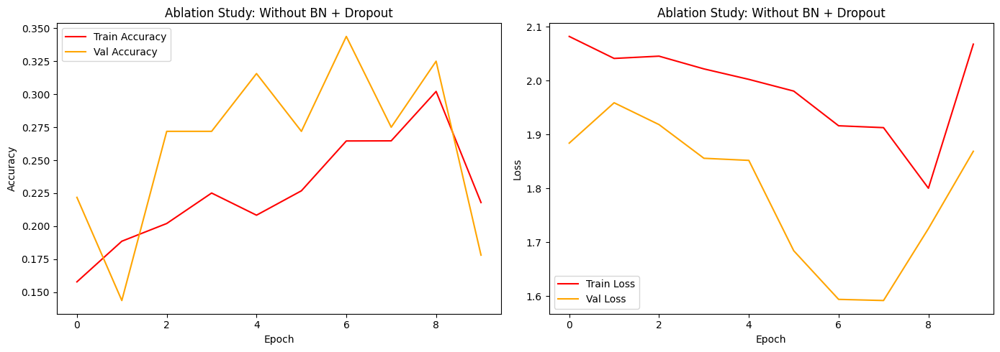


Ablation (No BN/Dropout) Best Val Accuracy: 34.38%
Deeper Model (With BN/Dropout) Val Accuracy: 23%

Conclusion: BN and Dropout are critical regularization components!


In [75]:
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt

# Model WITHOUT BatchNormalization and Dropout
def build_ablation_model():
    model = models.Sequential([
        layers.Conv2D(32, (3,3), activation='relu', padding='same', input_shape=(224,224,3)),
        layers.Conv2D(32, (3,3), activation='relu', padding='same'),
        layers.MaxPooling2D((2,2)),

        layers.Conv2D(64, (3,3), activation='relu', padding='same'),
        layers.Conv2D(64, (3,3), activation='relu', padding='same'),
        layers.MaxPooling2D((2,2)),

        layers.Conv2D(128, (3,3), activation='relu', padding='same'),
        layers.Conv2D(128, (3,3), activation='relu', padding='same'),
        layers.MaxPooling2D((2,2)),

        layers.GlobalAveragePooling2D(),
        layers.Dense(256, activation='relu'),
        layers.Dense(128, activation='relu'),
        layers.Dense(9, activation='softmax')
    ])
    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

print("Training Ablation Model (No BN, No Dropout)...")
ablation_model = build_ablation_model()
h_ablation = ablation_model.fit(
    train_gen, validation_data=val_gen,
    epochs=10, steps_per_epoch=30,
    validation_steps=10,
    callbacks=[early_stop]
)

plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(h_ablation.history['accuracy'], label='Train Accuracy', color='red')
plt.plot(h_ablation.history['val_accuracy'], label='Val Accuracy', color='orange')
plt.title('Ablation Study: Without BN + Dropout')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(h_ablation.history['loss'], label='Train Loss', color='red')
plt.plot(h_ablation.history['val_loss'], label='Val Loss', color='orange')
plt.title('Ablation Study: Without BN + Dropout')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

print(f"\nAblation (No BN/Dropout) Best Val Accuracy: {max(h_ablation.history['val_accuracy'])*100:.2f}%")
print(f"Deeper Model (With BN/Dropout) Val Accuracy: 23%")
print("\nConclusion: BN and Dropout are critical regularization components!")

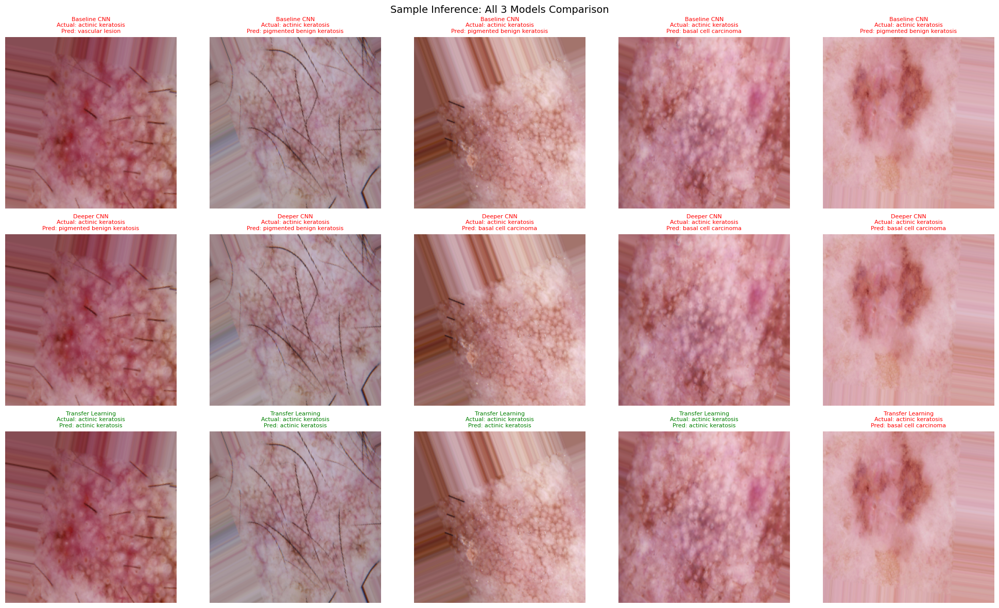

In [76]:
import numpy as np
import matplotlib.pyplot as plt

# Sample inference on all 3 models
val_gen.reset()
images, labels = next(val_gen)
class_names = list(val_gen.class_indices.keys())

fig, axes = plt.subplots(3, 5, figsize=(20, 12))
model_names = ['Baseline CNN', 'Deeper CNN', 'Transfer Learning']
models_list = [baseline_model, deeper_model, variant_model]

for row, (model, name) in enumerate(zip(models_list, model_names)):
    preds = model.predict(images[:5], verbose=0)
    for col in range(5):
        axes[row, col].imshow(images[col])
        actual = class_names[np.argmax(labels[col])]
        predicted = class_names[np.argmax(preds[col])]
        color = 'green' if actual == predicted else 'red'
        axes[row, col].set_title(
            f"{name}\nActual: {actual}\nPred: {predicted}",
            color=color, fontsize=8)
        axes[row, col].axis('off')

plt.suptitle('Sample Inference: All 3 Models Comparison', fontsize=14)
plt.tight_layout()
plt.show()

In [29]:
import os

# Search for the file in the E: drive
print("Searching for your model file...")
for root, dirs, files in os.walk(r"E:\AI_Project"):
    if "skin_cancer" in "".join(files): # Look for any file with 'skin_cancer' in the name
        for file in files:
            if file.endswith(('.keras', '.h5')):
                print(f"✅ FOUND IT: {os.path.join(root, file)}")

Searching for your model file...
✅ FOUND IT: E:\AI_Project\skin_cancer_variant.keras
